In [1]:
include("./PeriodicKdV.jl")
using .PeriodicKdV
using LinearAlgebra

In [20]:
W1 = WeightedInterval(-2.0,-1.0,chebV)
W2 = WeightedInterval(1.0,2.0,chebW);
W3 = WeightedInterval(-4.0,-3.0,chebV)
W4 = WeightedInterval(3.0,4.0,chebW);
W5 = WeightedInterval(-5.0,-4.5,chebV)
W6 = WeightedInterval(4.5,5.0,chebW);

C1 = Cut([0 1im; -1im 0],W1)
C2 = Cut([0 -1im; 1im 0],W2)
C3 = Cut([0 1im; -1im 0],W3)
C4 = Cut([0 -1im; 1im 0],W4)
C5 = Cut([0 1im; -1im 0],W5)
C6 = Cut([0 -1im; 1im 0],W6)

RHP = [C1,C2,C3,C4,C5,C6];
out = SIE(RHP,30);

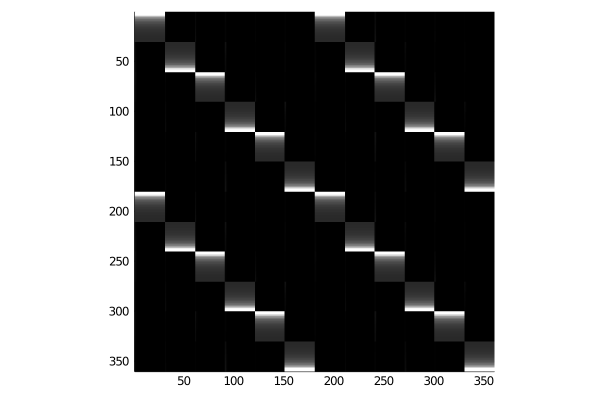

In [4]:
out[3] |> spy

In [9]:
n = 30
svd(out[3][1:n,n+1:2n]).S

30-element Array{Float64,1}:
 0.16457663928214725
 0.0016971389633619874
 1.2546438738441183e-5
 9.23561266159732e-8
 6.798251036562344e-10
 5.0041300002949965e-12
 3.6834940012136795e-14
 2.7114248889959603e-16
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 ⋮
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.638088867755728e-17
 1.6320251646373186e-17

In [11]:
n = 30
svd(out[3][1:n,4n+1:5n]).S

30-element Array{Float64,1}:
 0.07128461659470932
 0.0003053405676933652
 9.340940386201642e-7
 2.8484329299499757e-9
 8.6858627296386e-12
 2.6486213425128955e-14
 8.070351388651353e-17
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 ⋮
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18
 7.117072674734605e-18

In [21]:
n = 20
(S,b,Sp,bp,sol,solp,p) = SIE_new(RHP,n,1e-13);

Time for generation and compression
  0.262301 seconds (719.06 k allocations: 44.261 MiB)
Time for operator construction
  0.000744 seconds (929 allocations: 617.594 KiB)
Time to solve
iteration = 2, residual = 1.311163042431196
iteration = 3, residual = 0.08162731844434783
iteration = 4, residual = 0.0018420317346706065
iteration = 5, residual = 4.287390485517285e-6
iteration = 6, residual = 1.125779939242749e-8
iteration = 7, residual = 8.446854103238075e-12
iteration = 8, residual = 4.564583298985974e-15
  0.071579 seconds (13.05 k allocations: 5.759 MiB, 31.85% gc time)


In [23]:
n = 80
(S,b,Sp,bp,sol,solp,p) = SIE_new(RHP,n,1e-13);

Time for generation and compression
  1.244987 seconds (2.98 M allocations: 231.744 MiB, 4.43% gc time)
Time for operator construction
  0.008718 seconds (977 allocations: 8.346 MiB)
Time to solve
iteration = 2, residual = 1.3111630424311993
iteration = 3, residual = 0.08162731844434776
iteration = 4, residual = 0.0018420317346706315
iteration = 5, residual = 4.287390485517944e-6
iteration = 6, residual = 1.125779939241893e-8
iteration = 7, residual = 8.446853508286164e-12
iteration = 8, residual = 3.2264878223390456e-15
  0.150930 seconds (13.19 k allocations: 32.159 MiB)


In [16]:
dx = 0.5
L = 50
scale = x -> x.*abs.(x)
left = -L:2dx:-2dx |> Array |> scale
right = -L+dx:2dx:-dx |> Array |> scale
fV = (x,y) -> WeightedInterval(x,y,chebV)
fW = (x,y) -> WeightedInterval(x,y,chebW)

WIm = map(fV,left,right)
WIp = map(fW,-right,-left) |> reverse
Jm = [0 1im; -1im 0]
Jp = conj(Jm)
gp = x -> Cut(Jp, x)
gm = x -> Cut(Jm, x)

RHP = vcat(map(gm,WIm),map(gp,WIp));

In [17]:
out = SIE_new(RHP,10,1e-12,100);

Time for generation and compression
 20.519176 seconds (72.71 M allocations: 4.374 GiB, 3.95% gc time)
Time for operator construction
  0.103271 seconds (152.43 k allocations: 27.186 MiB, 19.25% gc time)
Time to solve
iteration = 2, residual = 28.62895981013012
iteration = 3, residual = 13.576212728967544
iteration = 4, residual = 5.176492522351747
iteration = 5, residual = 1.873553212814781
iteration = 6, residual = 0.6708768066179123
iteration = 7, residual = 0.24134416257106378
iteration = 8, residual = 0.0866814252667364
iteration = 9, residual = 0.03135392765774269
iteration = 10, residual = 0.01132326520332589
iteration = 11, residual = 0.0041161229500050606
iteration = 12, residual = 0.00149210530468398
iteration = 13, residual = 0.0005438571034718782
iteration = 14, residual = 0.00019732638530118408
iteration = 15, residual = 7.179275147718959e-5
iteration = 16, residual = 2.591886481728719e-5
iteration = 17, residual = 9.340587691779809e-6
iteration = 18, residual = 3.32789708

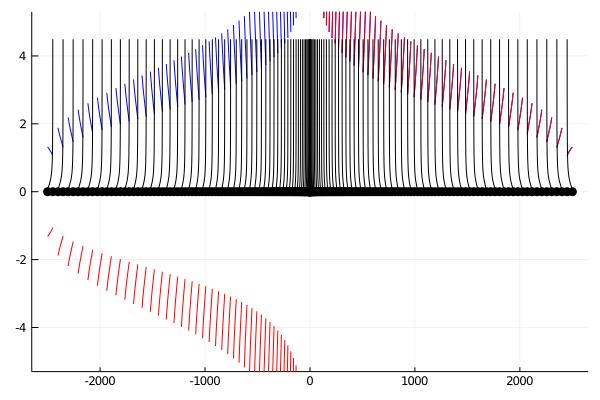

In [18]:
FunPlot(out[1])

In [42]:
dx = 0.5
L = 500
left = -L:2dx:-2dx |> Array
gapfun = x -> 1.5./(1 .+ x.^2)
sp = 1.0:1.0:length(left) |> Vector
len = dx*gapfun(sp) |> reverse
right = left + len
fV = (x,y) -> WeightedInterval(x,y,chebV)
fW = (x,y) -> WeightedInterval(x,y,chebW)

WIm = map(fV,left,right)
WIp = map(fW,-right,-left) |> reverse
Jm = [0 1im; -1im 0]
Jp = conj(Jm)
gp = x -> Cut(Jp, x)
gm = x -> Cut(Jm, x)

RHP = vcat(map(gm,WIm),map(gp,WIp));

In [43]:
n = 10
out = SIE_new(RHP,n,1e-12,100);

Time for generation and compression
903.249313 seconds (3.29 G allocations: 236.135 GiB, 7.89% gc time)
Time for operator construction
 10.899196 seconds (15.05 M allocations: 1.240 GiB, 15.80% gc time)
Time to solve
iteration = 2, residual = 0.23531159377681576
iteration = 3, residual = 0.010098047357292396
iteration = 4, residual = 0.0002693735477168879
iteration = 5, residual = 5.03730805747334e-6
iteration = 6, residual = 5.993339999543524e-8
iteration = 7, residual = 5.97759897750348e-10
iteration = 8, residual = 4.010824486434969e-12
iteration = 9, residual = 2.2874812538102167e-13
159.287392 seconds (377.89 M allocations: 55.081 GiB, 25.03% gc time)


In [44]:
FunPlot(out[1])

In [45]:
2*L*2*n

20000